This notebook was copied from kaggle notebook.   

You have to run this within kaggle environment to avoid errors.

These code are for EDA using preprocessed dataset which has been binned to 187 and 375 time steps.

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm
#from astropy.stats import sigma_clip
import itertools, os
import plotly.graph_objects as go

In [2]:
train_adc_info = pd.read_csv('/kaggle/input/ariel-data-challenge-2024/train_adc_info.csv',
                           index_col='planet_id')
axis_info = pd.read_parquet('/kaggle/input/ariel-data-challenge-2024/axis_info.parquet')
train_labels = pd.read_csv("/kaggle/input/ariel-data-challenge-2024/train_labels.csv")
train_labels = np.array(train_labels)

pre_train_187 = np.load("/kaggle/input/preprocessed-train-187/pre_train.npy")
pre_test_187 = np.load("/kaggle/input/preprocessed-train-187/pre_test.npy")
pre_train_375 = np.load("/kaggle/input/preproceesed-data-375/pre_train_375.npy")
pre_test_375 = np.load("/kaggle/input/preproceesed-data-375/pre_test_375.npy")

In [3]:
print(pre_train_375.shape, pre_test_375.shape)

(673, 375, 283) (1, 375, 283)


In [4]:
train_dp = pd.DataFrame(pre_train_375[0])
test_dp = pd.DataFrame(pre_test_375[0])

In [5]:
train_dp.describe()

,0,1,2,3,4,5,6,7,8,9,...,273,274,275,276,277,278,279,280,281,282
count,375.000000,375.000000,375.000000,375.000000,375.000000,375.000000,375.000000,375.000000,375.000000,375.000000,...,375.000000,375.000000,375.000000,375.000000,375.000000,375.000000,375.000000,375.000000,375.000000,375.000000
mean,280.240627,167.250151,178.906140,192.391499,211.059326,226.614453,243.939756,260.966594,277.342353,294.462725,...,5270.932139,5210.664557,5163.950233,5046.715076,4924.442408,4621.577165,4278.864154,3919.129266,3514.770533,3147.967704
std,0.208515,0.883389,0.947299,1.060711,0.992931,0.971032,1.092855,1.023078,1.023237,1.005460,...,6.920592,6.515522,6.225506,6.208728,6.225229,5.850557,5.383499,4.824134,4.604825,4.230556
min,279.850925,164.634318,176.471215,189.724635,208.302053,223.703548,241.058287,257.368987,274.395681,292.003299,...,5255.987014,5194.242651,5150.427949,5030.640227,4910.408411,4605.861385,4265.383198,3908.424462,3502.839266,3137.164082
25%,280.066998,166.590455,178.240093,191.671721,210.424092,225.975578,243.229324,260.274161,276.673743,293.756313,...,5265.902874,5205.904037,5159.237075,5041.684203,4919.466049,4617.138155,4274.983739,3915.530458,3511.366144,3144.852178
50%,280.202990,167.350373,178.946605,192.360547,211.035685,226.657398,243.950754,261.001029,277.291188,294.429536,...,5270.863468,5210.832763,5164.179555,5046.601608,4924.417942,4621.882473,4279.122095,3918.916724,3514.755841,3147.839439
75%,280.448878,167.855936,179.524696,193.155062,211.706155,227.205635,244.711536,261.636544,277.957716,295.112641,...,5275.551180,5215.041433,5167.963890,5050.752215,4929.041911,4625.604029,4282.709065,3922.532272,3518.007156,3151.062407
max,280.653581,169.267715,181.763849,195.450484,214.097813,229.396178,246.994852,263.879101,280.387038,297.194655,...,5289.956453,5229.722281,5181.919852,5066.106395,4941.706114,4635.611915,4293.979345,3936.019447,3527.657916,3161.335682


In [6]:
test_dp.describe()

,0,1,2,3,4,5,6,7,8,9,...,273,274,275,276,277,278,279,280,281,282
count,375.000000,375.000000,375.000000,375.000000,375.000000,375.000000,375.000000,375.000000,375.000000,375.000000,...,375.000000,375.000000,375.000000,375.000000,375.000000,375.000000,375.000000,375.000000,375.000000,375.000000
mean,278.892550,161.617303,177.561480,197.642204,216.502180,240.340865,249.937075,258.841961,275.183504,322.449993,...,5098.984183,5173.345627,5125.806929,5133.726795,4889.057912,4588.044208,4247.919332,3891.459773,3489.930911,3226.257859
std,0.402768,0.936250,1.205621,1.154564,1.058667,1.122385,1.239731,1.082600,1.199400,1.274327,...,7.451641,7.484147,7.473781,7.977565,7.621129,6.760313,6.443276,6.037372,5.740583,5.303478
min,278.171632,158.952610,174.448218,194.345107,213.742901,236.607811,245.772440,255.785837,271.842386,319.194912,...,5080.884791,5155.117110,5105.666519,5116.845081,4870.753918,4569.244055,4233.322523,3876.037339,3476.283098,3213.668902
25%,278.391874,160.910315,176.748006,196.810730,215.810705,239.494536,249.150835,258.047056,274.380560,321.656555,...,5092.171096,5166.148970,5118.667785,5126.701159,4881.818291,4581.990480,4242.259939,3886.276016,3484.758235,3221.742267
50%,279.116622,161.620898,177.546210,197.658339,216.514433,240.297325,249.942265,258.822277,275.204399,322.445494,...,5101.389294,5174.828871,5127.914562,5135.792779,4891.035385,4590.127465,4249.081770,3892.712185,3491.184182,3227.386034
75%,279.212329,162.254688,178.307728,198.451238,217.189671,241.101789,250.768527,259.543486,275.990893,323.255029,...,5104.957470,5179.771993,5131.794244,5139.553000,4894.950966,4593.204809,4253.352334,3896.327408,3494.469246,3230.273378
max,279.420318,164.187320,181.086029,201.060981,219.763772,243.579241,254.118698,261.910601,278.732005,327.022765,...,5111.922241,5189.439412,5140.376734,5150.334018,4903.915148,4601.720301,4261.061630,3903.359419,3501.925923,3237.242868


3D Visualization of signal intensity by time steps and wavelenngths of planet 785834

In [ ]:
AIRS_image = pre_train_375[0, :, :]
fig_AIRS = go.Figure(data=[go.Surface(z=AIRS_image, colorscale='Viridis')])
fig_AIRS.update_layout(
    title="pre_train - planet 785834",
    scene=dict(
        xaxis_title='WL (Rows)',
        yaxis_title='TIme (Columns)',
        zaxis_title='Intensity'
    ),
    autosize=False,
    width=800,
    height=800
)
fig_AIRS.show()

3D Visualization of signal intensity by planets and wavelenngths at middel of transit

In [ ]:
AIRS_image = pre_train_375[:, 187, :]
fig_AIRS = go.Figure(data=[go.Surface(z=AIRS_image, colorscale='Viridis')])
fig_AIRS.update_layout(
    title="planets - center of transit",
    scene=dict(
        xaxis_title='WL (Rows)',
        yaxis_title='planets (Columns)',
        zaxis_title='Intensity'
    ),
    autosize=False,
    width=800,
    height=800
)
fig_AIRS.show()

Train set label distribution

In [ ]:
AIRS_image = train_labels[:, 1:]
fig_AIRS = go.Figure(data=[go.Surface(z=AIRS_image, colorscale='Viridis')])
fig_AIRS.update_layout(
    title="Train_labels",
    scene=dict(
        xaxis_title='WL (Rows)',
        yaxis_title='planets (Columns)',
        zaxis_title='Intensity'
    ),
    autosize=False,
    width=800,
    height=800
)
fig_AIRS.show()

Classify solar system

In [10]:
def classificator(column : str, value: int, data = train_adc_info):
    included_index_list = []
    excluded_index_list = []
    
    for i in range(len(data)):
        if data.iloc[i]['star'] == 1: included_index_list.append(i)
        else: excluded_index_list.append(i)
    return included_index_list, excluded_index_list
        

In [11]:
indexes, exdexes = classificator('star', 1)
solar_1_labels = train_labels[indexes]
solar_0_labels = train_labels[exdexes]

In [12]:
solar_1_labels.shape

(327, 284)

Solar system 0 train set label distribution

In [ ]:
import plotly.graph_objects as go
AIRS_image = solar_0_labels[:, 1:]
fig_AIRS = go.Figure(data=[go.Surface(z=AIRS_image, colorscale='Viridis')])
fig_AIRS.update_layout(
    title="solar 0 target tendancy along planets",
    scene=dict(
        xaxis_title='WL (Rows)',
        yaxis_title='planets (Columns)',
        zaxis_title='Intensity'
    ),
    autosize=False,
    width=800,
    height=800
)
fig_AIRS.show()

Solar system 1 train set label distribution

In [14]:
import plotly.graph_objects as go
AIRS_image = solar_1_labels[:, 1:]
# 3D Visualization of AIRS Cleaned Signal
fig_AIRS = go.Figure(data=[go.Surface(z=AIRS_image, colorscale='Viridis')])
fig_AIRS.update_layout(
    title="solar 1 target tendancy along planets",
    scene=dict(
        xaxis_title='WL (Rows)',
        yaxis_title='planets (Columns)',
        zaxis_title='Intensity'
    ),
    autosize=False,
    width=800,
    height=800
)
fig_AIRS.show()

Classify solar systems in train set

In [15]:
indexes, exdexes = classificator('star', 1)
solar_1_train_375 = pre_train_375[indexes]
solar_0_train_375 = pre_train_375[exdexes]
solar_1_train_187 = pre_train_187[indexes]
solar_0_train_187 = pre_train_187[exdexes]

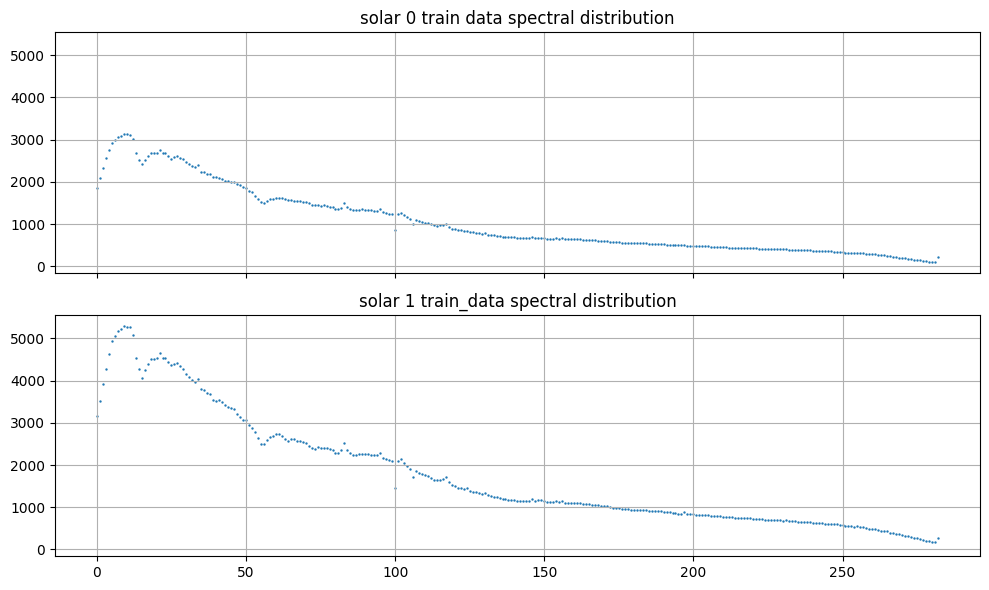

In [16]:
fig, axes = plt.subplots(nrows = 2, ncols=1, sharex = True, sharey = True, figsize=(10,6))
axes[0].scatter(x=np.arange(len(solar_1_train_375[0][0])), y = np.flip(solar_0_train_375[0, 0, :]), s=0.5)
axes[0].grid(True)
axes[0].set_title('solar 0 train data spectral distribution')
axes[1].scatter(x=np.arange(len(solar_1_train_375[0][0])), y = np.flip(solar_1_train_375[0, 0, :]), s=0.5)
axes[1].grid(True)
axes[1].set_title('solar 1 train_data spectral distribution')
plt.tight_layout()
plt.show()

In [17]:
pd.DataFrame(solar_0_train_375[0, 0, :]*1.6889889072653612).describe()

,0
count,283.000000
mean,1776.167925
std,1326.545437
min,166.364403
25%,758.146399
50%,1158.944117
75%,2524.440732
max,5289.828612


In [18]:
pd.DataFrame(solar_1_train_375[0, 0, :]).describe()

,0
count,283.000000
mean,1774.537799
std,1317.398066
min,168.236037
25%,768.021000
50%,1173.024284
75%,2496.186689
max,5282.755049


In [19]:
correlation = np.corrcoef(solar_0_train_375[0, 0, :]*1.6889889072653612, solar_1_train_375[0, 0, :])

correlation

array([[1.        , 0.99985433],
       [0.99985433, 1.        ]])

Signals of solar 0 is higher than solar 1

In [20]:
pd.DataFrame(solar_0_labels[0, 1:]).describe()

,0
count,283.000000
mean,0.002801
std,0.000015
min,0.002783
25%,0.002787
50%,0.002798
75%,0.002812
max,0.002838


In [21]:
pd.DataFrame(solar_1_labels[0, 1:]).describe()

,0
count,283.000000
mean,0.001130
std,0.000035
min,0.001066
25%,0.001098
50%,0.001131
75%,0.001160
max,0.001195


In [22]:
sub_254 = pd.read_csv('/kaggle/input/submissions/submission_254.csv')

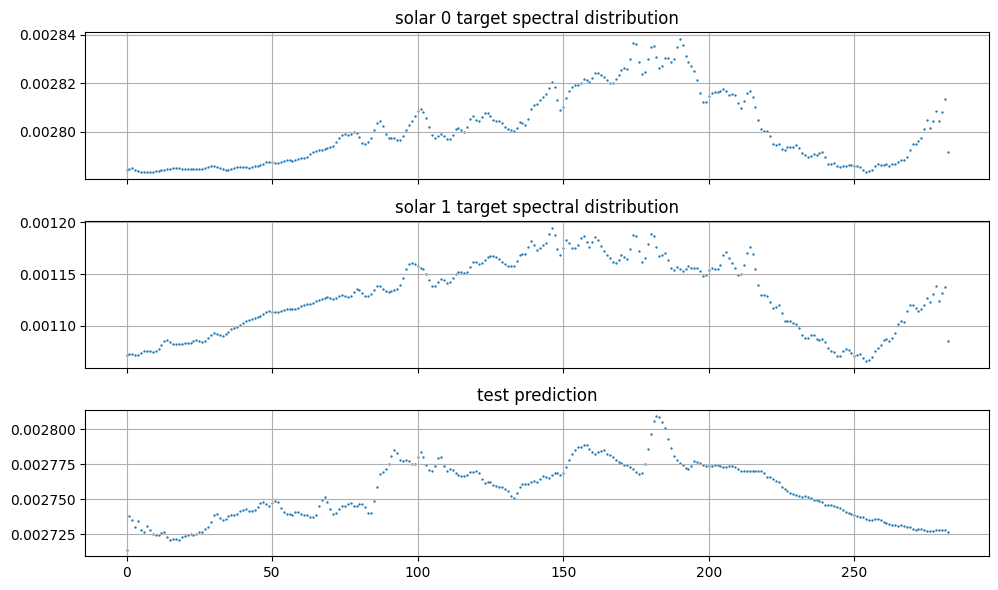

In [23]:
solar_0_labels.shape
fig, axes = plt.subplots(nrows = 3, ncols=1, sharex = True, sharey = False, figsize=(10,6))
axes[0].scatter(x=np.arange(len(solar_0_labels[0])-1), y = np.flip(solar_0_labels[0, 1:]), s=0.5)
axes[0].grid(True)
axes[0].set_title('solar 0 target spectral distribution')
axes[1].scatter(x=np.arange(len(solar_1_labels[0])-1), y = np.flip(solar_1_labels[0, 1:]), s=0.5)
axes[1].grid(True)
axes[1].set_title('solar 1 target spectral distribution')
axes[2].scatter(x=np.arange(len(solar_1_labels[0])-1), y = sub_254.values[0][1:284], s=0.5)
axes[2].grid(True)
axes[2].set_title('test prediction')
plt.tight_layout()
plt.show()

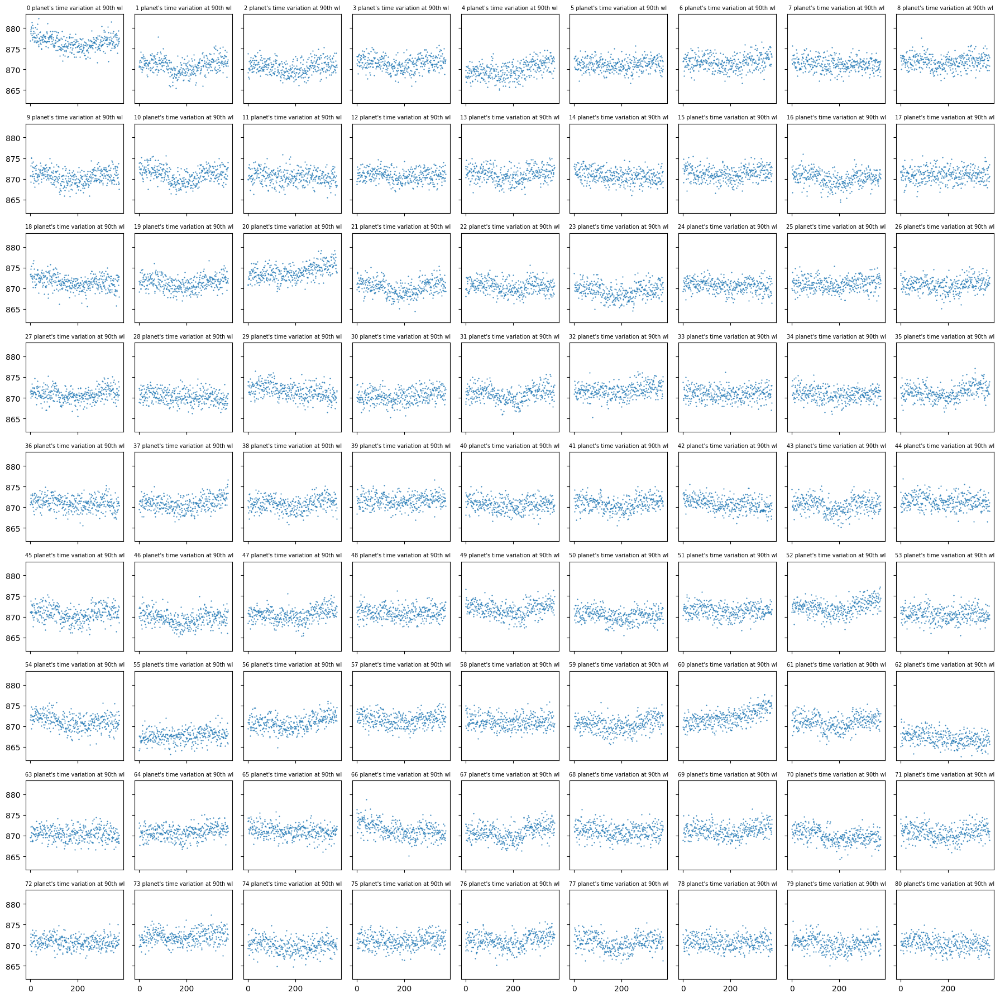

In [24]:
fig, axes = plt.subplots(nrows=9, ncols=9, sharex=True, sharey=True, figsize=(18, 18))
for i in range(9):
    for j in range(9):
        axes[i][j].scatter(x=np.arange(375), y=solar_1_train_375[i*9+j, :, 90],s=0.3)
        axes[i][j].set_title(f'{i*9+j} planet\'s time variation at 90th wl', fontsize=7)
plt.tight_layout()
plt.show()

Larger time binning leads to information loss, even though it becomes to robust to noise. 187, 375

90th wavelength differences by time steps of solar system 1

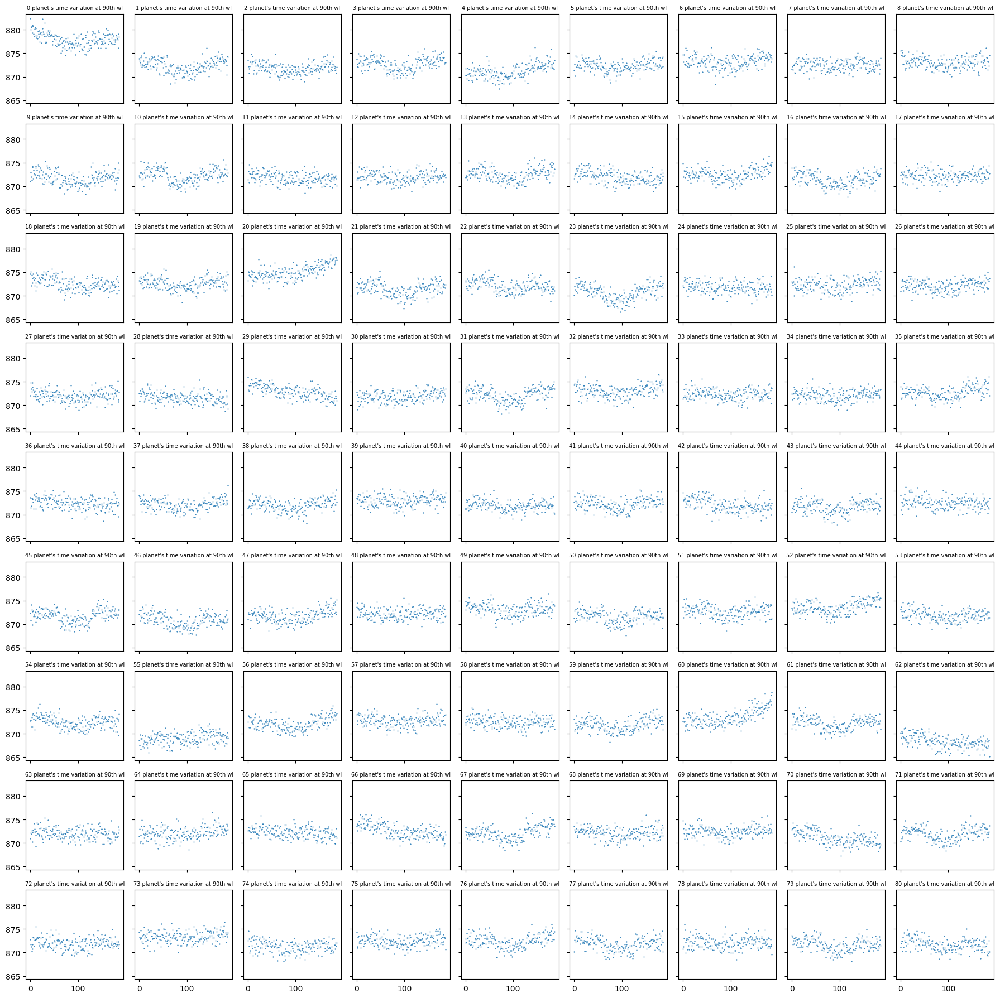

In [ ]:
fig, axes = plt.subplots(nrows=9, ncols=9, sharex=True, sharey=True, figsize=(18, 18))
for i in range(9):
    for j in range(9):
        axes[i][j].scatter(x=np.arange(187), y=solar_1_train_187[i*9+j, :, 90],s=0.3)
        axes[i][j].set_title(f'{i*9+j} planet\'s time variation at 90th wl',fontsize=7)
plt.tight_layout()
plt.show()


Idea: Try training mobilnet or ridge model using planets with distinct transits? 

In [ ]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# AIRS_image_0 = solar_0_labels[:, :].transpose()
# AIRS_image_1 = solar_1_labels[:, :].transpose()
AIRS_image_0 = solar_0_labels[:, 1:]
AIRS_image_1 = solar_1_labels[:, 1:]

fig = make_subplots(
    rows=1, cols=2, 
    specs=[[{'type': 'surface'}, {'type': 'surface'}]],  
    subplot_titles=("train_labels star 0 - 3D Visualization", "train_labels star 1 - 3D Visualization")
)
fig.add_trace(go.Surface(z=AIRS_image_0, colorscale='Viridis'), row=1, col=1)

fig.add_trace(go.Surface(z=AIRS_image_1, colorscale='Viridis'), row=1, col=2)

fig.update_layout(
    title="3D Visualization of train_labels (Star 0 and Star 1)",
    autosize=True,

)

fig.update_scenes(
    dict(
        xaxis_title='planets',
        yaxis_title='AIRS WL',
        zaxis_title='Intensity'
    ), row=1, col=1)

fig.update_scenes(
    dict(
        xaxis_title='planets',
        yaxis_title='AIRS WL',
        zaxis_title='Intensity'
    ), row=1, col=2)

fig.show()

Mobile training submissions analysis

In [32]:
sub_545 = pd.read_csv("/kaggle/input/submissions/submission_545.csv")
sub_254 = pd.read_csv("/kaggle/input/submissions/submission_254.csv")
sub_339 = pd.read_csv("/kaggle/input/submissions/submission_339.csv")
sub_268 = pd.read_csv("/kaggle/input/submissions/submission_268.csv")
sub_254 = pd.read_csv("/kaggle/input/submissions/submission_254.csv")
sub_244 = pd.read_csv('/kaggle/input/submissions/submission_244.csv')
sub_106 = pd.read_csv("/kaggle/input/submissions/submission_106.csv")
sub_165 = pd.read_csv('/kaggle/input/submissions/submission_165.csv')

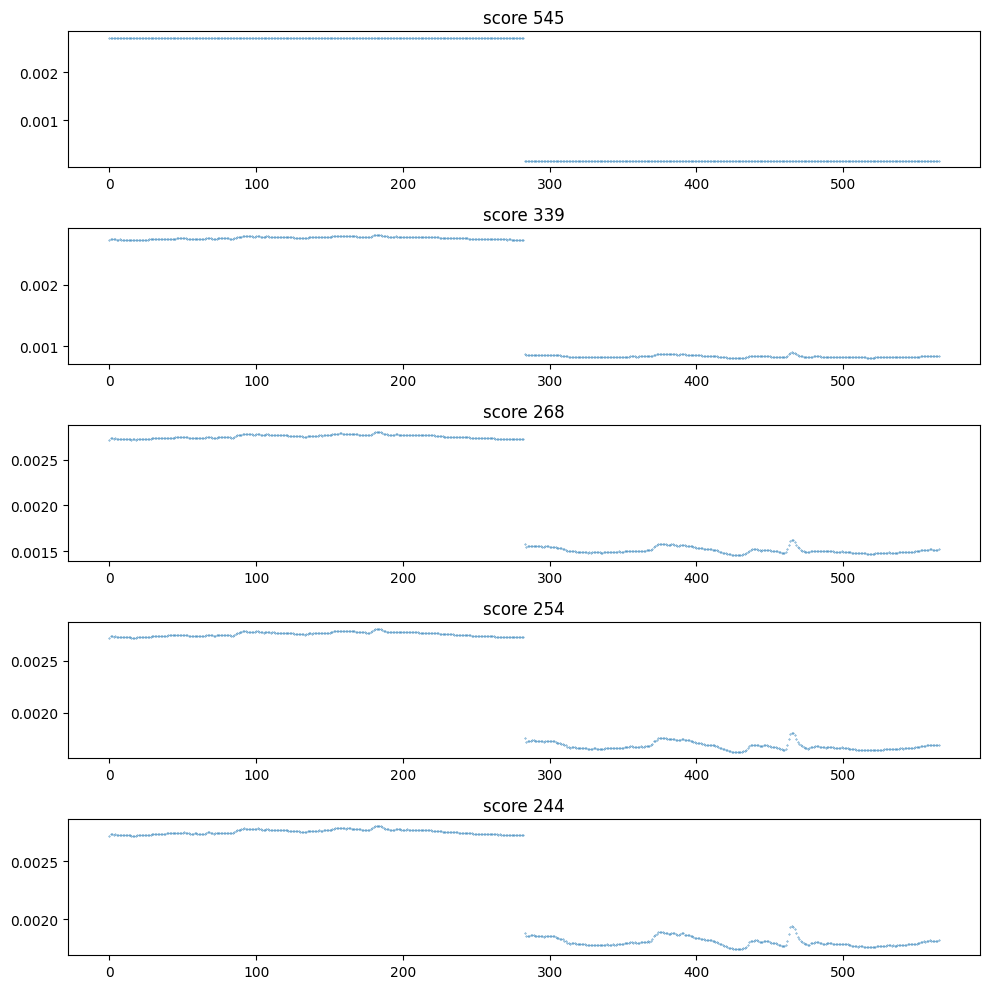

In [33]:
fig, axes = plt.subplots(nrows=5, ncols=1, figsize=(10, 10))
axes[0].scatter(x=np.arange(566), y=sub_545.values[0][1:], s=.1)
axes[0].set_title('score 545')
axes[1].scatter(x=np.arange(566), y=sub_339.values[0][1:], s=.1)
axes[1].set_title('score 339')
axes[2].scatter(x=np.arange(566), y=sub_268.values[0][1:], s=.1)
axes[2].set_title('score 268')
axes[3].scatter(x=np.arange(566), y=sub_254.values[0][1:], s=.1)
axes[3].set_title('score 254')
axes[4].scatter(x=np.arange(566), y=sub_244.values[0][1:], s=.1)
axes[4].set_title('score 244')
plt.tight_layout()
plt.show()

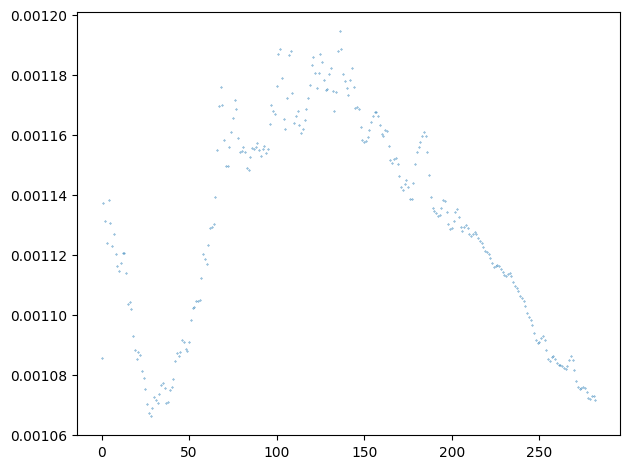

In [34]:
plt.plot()
plt.scatter(x=np.arange(283), y=train_labels[0,1:], s=.1)
plt.tight_layout()
plt.show()

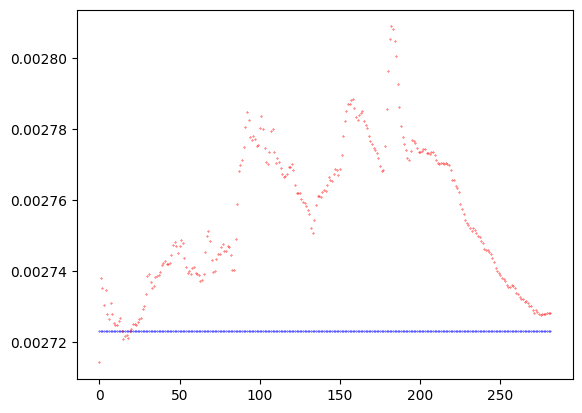

In [35]:
plt.plot(figsize=(7,10))
plt.scatter(x=np.arange(282), y=sub_545.values[0][1:283], s=.1, c='b')
plt.scatter(x=np.arange(282), y=sub_339.values[0][1:283], s=.1, c='r')
plt.show()

Reducing additional preds and adjusting additional sigmas could lead to high scores. 

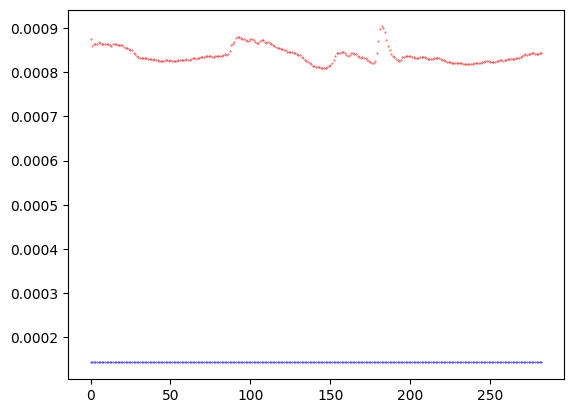

In [36]:
plt.plot(figsize=(7,10))
plt.scatter(x=np.arange(283), y=sub_545.values[0][284:], s=.1, c='b')
plt.scatter(x=np.arange(283), y=sub_339.values[0][284:], s=.1, c='r')
plt.show()

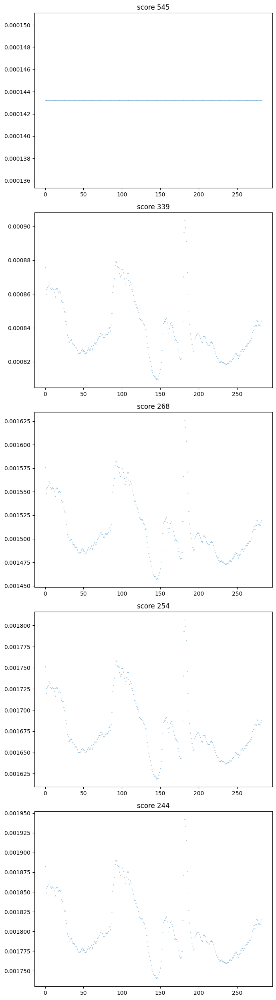

In [37]:
fig, axes = plt.subplots(nrows=5, ncols=1, figsize=(7, 25))
axes[0].scatter(x=np.arange(283), y=sub_545.values[0][284:], s=.1)
axes[0].set_title('score 545')
axes[1].scatter(x=np.arange(283), y=sub_339.values[0][284:], s=.1)
axes[1].set_title('score 339')
axes[2].scatter(x=np.arange(283), y=sub_268.values[0][284:], s=.1)
axes[2].set_title('score 268')
axes[3].scatter(x=np.arange(283), y=sub_254.values[0][284:], s=.1)
axes[3].set_title('score 254')
axes[4].scatter(x=np.arange(283), y=sub_244.values[0][284:], s=.1)
axes[4].set_title('score 244')
plt.tight_layout()
plt.show()

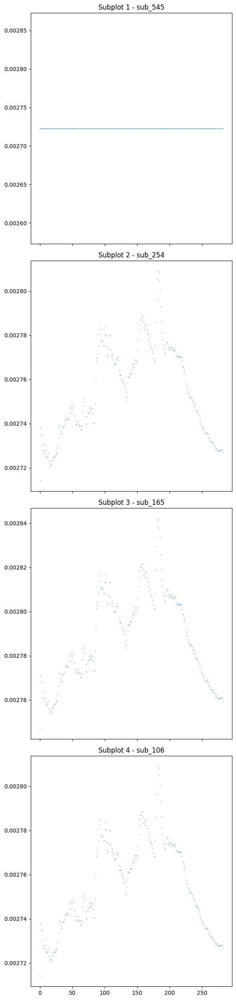

In [38]:

fig, axes = plt.subplots(nrows=4, ncols=1, sharex=True, sharey=False, figsize=(6, 25))

axes[0].scatter(x=np.arange(283), y=sub_545.values[0][1:284], s=.1)
axes[0].set_title("Subplot 1 - sub_545")

axes[1].scatter(x=np.arange(283), y=sub_254.values[0][1:284], s=.1)
axes[1].set_title("Subplot 2 - sub_254")

axes[2].scatter(x=np.arange(283), y=sub_165.values[0][1:284], s=.1)
axes[2].set_title("Subplot 3 - sub_165")

axes[3].scatter(x=np.arange(283), y=sub_106.values[0][1:284], s=.1)
axes[3].set_title("Subplot 4 - sub_106")

plt.tight_layout() 
plt.show()

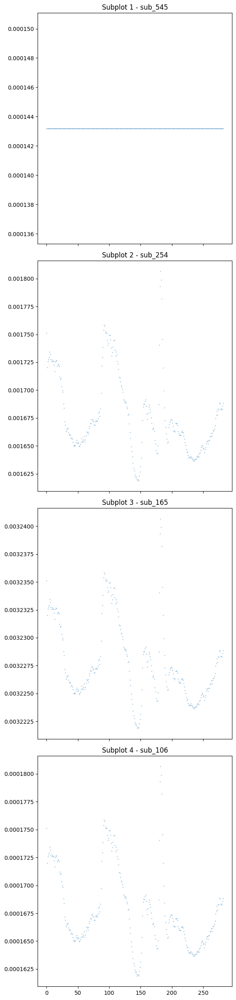

In [39]:
fig, axes = plt.subplots(nrows=4, ncols=1, sharex=True, sharey=False, figsize=(6, 25))

axes[0].scatter(x=np.arange(283), y=sub_545.values[0][284:], s=.1)
axes[0].set_title("Subplot 1 - sub_545")

axes[1].scatter(x=np.arange(283), y=sub_254.values[0][284:], s=.1)
axes[1].set_title("Subplot 2 - sub_254")

axes[2].scatter(x=np.arange(283), y=sub_165.values[0][284:], s=.1)
axes[2].set_title("Subplot 3 - sub_165")

axes[3].scatter(x=np.arange(283), y=sub_106.values[0][284:], s=.1)
axes[3].set_title("Subplot 4 - sub_106")

plt.tight_layout() 
plt.show()

In [40]:
diff = sub_545.values[0][1:283] - sub_254.values[0][1:283]
pd.DataFrame(diff).describe()

,0
count,282.000000
mean,-0.000033
std,0.000020
min,-0.000086
25%,-0.000050
50%,-0.000031
75%,-0.000016
max,0.000009


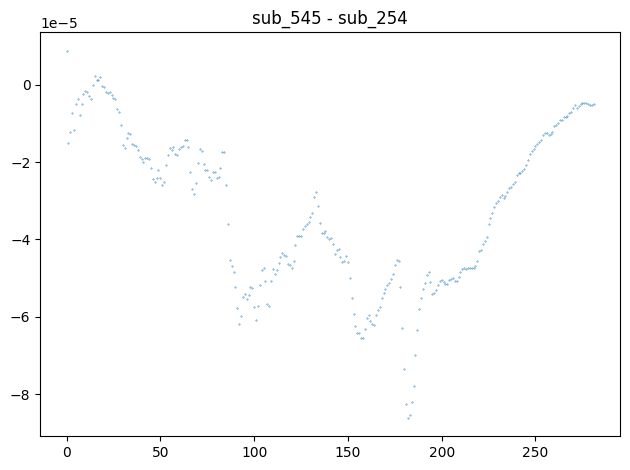

In [41]:
# Create subplots
plt.plot(figsize=(10,6))
# Plot each scatter plot on a separate axis
plt.scatter(x=np.arange(282), y=diff, s=.1)
plt.title("sub_545 - sub_254")


# Show the plot
plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()

In [42]:
uncertainty_diff_1 = sub_545.values[0][283:] - sub_254.values[0][283:]
uncertainty_diff_2 = sub_545.values[0][283:] - sub_106.values[0][283:]
print('sub_545 - sub_254\n', pd.DataFrame(uncertainty_diff_1).describe(),'\nsub_545 - sub_106\n', pd.DataFrame(uncertainty_diff_2).describe())

sub_545 - sub_254
                 0
count  284.000000
mean    -0.001530
std      0.000098
min     -0.001663
25%     -0.001550
50%     -0.001526
75%     -0.001510
max     -0.000004 
sub_545 - sub_106
                 0
count  284.000000
mean    -0.000025
std      0.000004
min     -0.000037
25%     -0.000026
50%     -0.000024
75%     -0.000022
max     -0.000004


Too much differences compared to 1e-3 scale precision